# Exercise 3: Facial Detection

 ## Names:
 - Idan Dunsky - 319070595
 - Yaniv Kaveh-Shtul - 206768004


#TL;DR

In this exercise, we utilized OpenCV's facial detection. The process began with data cleansing using Pandas, where we filtered out images from `faces_meta_data.csv` that contained either no faces or multiple faces, leaving only those with exactly one face. We then refined the dataset to include only the celebrities listed in `celebs4face_detection.csv` and displayed 2 representative images for each of the 14 celebrities.

Next, we created a Dataset object where the `__getitem__()` method returned both the celebrity label (ground truth) and the corresponding image. We also implemented 5 image augmentations aimed at improving the performance of the facial recognition model.

Finally, we used OpenCV to detect faces within images and wrote a function to swap faces between two images. This function identified the bounding boxes of detected faces, resized the images to ensure they matched in size, and then performed the face-swapping operation.

# Imports

In [218]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import albumentations as A
from albumentations import (
    HorizontalFlip, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    GaussNoise, MotionBlur, MedianBlur, RandomBrightnessContrast, Flip, OneOf, Compose, Rotate, Affine, CenterCrop,Spatter
)

from torch.utils.data import Dataset

np.random.seed(42)


# Load the Data

We will load the data using pandas module.

First we will use the `Faces metadata.csv` that contains the following data for each image:

- `photo_taken`: year when the photo was taken
- `full_path`: path to file
- `gender`: 0 for female and 1 for male, NaN if unknown
- `name`: name of the celebrity
- `face_score`: detector score (the higher the better). Inf implies that no face was found in the image and the face_location then just returns the entire image
- `second_face_score`: detector score of the face with the second highest score. This is useful to ignore images with more than one face. second_face_score is NaN if no second face was detected.
- `celeb_id` (IMDB only): index of celebrity name

In [219]:
data = pd.read_csv('Faces metadata.csv')
data

,Unnamed: 0,photo_taken,full_path,gender,name,face_score,second_face_score,celeb_id
0,0,1968,['01/nm0000001_rm124825600_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.459693,1.118973,6488
1,1,1970,['01/nm0000001_rm3343756032_1899-5-10_1970.jpg'],1.0,['Fred Astaire'],2.543198,1.852008,6488
2,2,1968,['01/nm0000001_rm577153792_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],3.455579,2.985660,6488
3,3,1968,['01/nm0000001_rm946909184_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.872117,NaN,6488
4,4,1968,['01/nm0000001_rm980463616_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.158766,NaN,6488
...,...,...,...,...,...,...,...,...
460718,460718,2011,['08/nm3994408_rm761245696_1989-12-29_2011.jpg'],0.0,['Jane Levy'],3.845884,NaN,8410
460719,460719,2011,['08/nm3994408_rm784182528_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,NaN,8410
460720,460720,2011,['08/nm3994408_rm926592512_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,NaN,8410
460721,460721,2011,['08/nm3994408_rm943369728_1989-12-29_2011.jpg'],0.0,['Jane Levy'],4.450725,NaN,8410


### First we will clean all the images with more than one face

In [220]:
only_one_face_df = data[data['second_face_score'].isna()]
only_one_face_df

,Unnamed: 0,photo_taken,full_path,gender,name,face_score,second_face_score,celeb_id
3,3,1968,['01/nm0000001_rm946909184_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.872117,NaN,6488
4,4,1968,['01/nm0000001_rm980463616_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.158766,NaN,6488
6,6,2004,['02/nm0000002_rm1346607872_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.479189,NaN,11516
7,7,2004,['02/nm0000002_rm1363385088_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.870171,NaN,11516
12,12,1974,['02/nm0000002_rm221957120_1924-9-16_1974.jpg'],0.0,['Lauren Bacall'],4.096431,NaN,11516
...,...,...,...,...,...,...,...,...
460718,460718,2011,['08/nm3994408_rm761245696_1989-12-29_2011.jpg'],0.0,['Jane Levy'],3.845884,NaN,8410
460719,460719,2011,['08/nm3994408_rm784182528_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,NaN,8410
460720,460720,2011,['08/nm3994408_rm926592512_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,NaN,8410
460721,460721,2011,['08/nm3994408_rm943369728_1989-12-29_2011.jpg'],0.0,['Jane Levy'],4.450725,NaN,8410


### Now the `second_face_score` column will be empty (NaN) - so we will drop it.

In [221]:
only_one_face_df = only_one_face_df.drop(['second_face_score', 'Unnamed: 0'], axis=1)
only_one_face_df

,photo_taken,full_path,gender,name,face_score,celeb_id
3,1968,['01/nm0000001_rm946909184_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.872117,6488
4,1968,['01/nm0000001_rm980463616_1899-5-10_1968.jpg'],1.0,['Fred Astaire'],1.158766,6488
6,2004,['02/nm0000002_rm1346607872_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.479189,11516
7,2004,['02/nm0000002_rm1363385088_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.870171,11516
12,1974,['02/nm0000002_rm221957120_1924-9-16_1974.jpg'],0.0,['Lauren Bacall'],4.096431,11516
...,...,...,...,...,...,...
460718,2011,['08/nm3994408_rm761245696_1989-12-29_2011.jpg'],0.0,['Jane Levy'],3.845884,8410
460719,2011,['08/nm3994408_rm784182528_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,8410
460720,2011,['08/nm3994408_rm926592512_1989-12-29_2011.jpg'],0.0,['Jane Levy'],-inf,8410
460721,2011,['08/nm3994408_rm943369728_1989-12-29_2011.jpg'],0.0,['Jane Levy'],4.450725,8410


### Now we will drop all the images with no faces in them - all the lines with empty `face_score`

In [238]:
only_one_face_df =  only_one_face_df.dropna(subset=['face_score'])
only_one_face_df = only_one_face_df[ only_one_face_df['face_score'] > 3 ]
only_one_face_df

,photo_taken,full_path,gender,name,face_score,celeb_id
6,2004,['02/nm0000002_rm1346607872_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.479189,11516
7,2004,['02/nm0000002_rm1363385088_1924-9-16_2004.jpg'],0.0,['Lauren Bacall'],3.870171,11516
12,1974,['02/nm0000002_rm221957120_1924-9-16_1974.jpg'],0.0,['Lauren Bacall'],4.096431,11516
13,2007,['02/nm0000002_rm2287049216_1924-9-16_2007.jpg'],0.0,['Lauren Bacall'],3.482030,11516
14,1974,['02/nm0000002_rm238734336_1924-9-16_1974.jpg'],0.0,['Lauren Bacall'],4.865421,11516
...,...,...,...,...,...,...
460697,2014,['08/nm3994408_rm3713712128_1989-12-29_2014.jpg'],0.0,['Jane Levy'],3.953947,8410
460702,2011,['08/nm3994408_rm4179992576_1989-12-29_2011.jpg'],0.0,['Jane Levy'],5.388248,8410
460715,2011,['08/nm3994408_rm73386752_1989-12-29_2011.jpg'],0.0,['Jane Levy'],4.801987,8410
460718,2011,['08/nm3994408_rm761245696_1989-12-29_2011.jpg'],0.0,['Jane Levy'],3.845884,8410


### Lets read the `celebs4face_detection.csv` in order to select the specific images of the wanted celebs.

In [239]:
celebs_df = pd.read_csv('Celebs for Face Detection.csv')
celebs_df.drop('Unnamed: 0', axis = 1 )

,celeb_id,name
0,1096,Angelina Jolie
1,2336,Brad Pitt
2,8811,Jennifer Aniston
3,14588,Nicole Kidman
4,3308,Charlize Theron
5,20250,Zooey Deschanel
6,19084,Tom Cruise
7,11666,Leighton Meester
8,8837,Jennifer Garner
9,8907,Jensen Ackles


In [240]:
celebs_images = only_one_face_df[only_one_face_df['celeb_id'].isin(celebs_df['celeb_id'])]

# reset indices (for comfort)
celebs_images.reset_index(drop=True ,inplace=True)
celebs_images

,photo_taken,full_path,gender,name,face_score,celeb_id
0,2007,['93/nm0000093_rm1029675776_1963-12-18_2007.jpg'],1.0,['Brad Pitt'],3.902247,2336
1,2008,['93/nm0000093_rm105223168_1963-12-18_2008.jpg'],1.0,['Brad Pitt'],3.918115,2336
2,2008,['93/nm0000093_rm1053667328_1963-12-18_2008.jpg'],1.0,['Brad Pitt'],3.995217,2336
3,1991,['93/nm0000093_rm1075806208_1963-12-18_1991.jpg'],1.0,['Brad Pitt'],3.191494,2336
4,2008,['93/nm0000093_rm1087870976_1963-12-18_2008.jpg'],1.0,['Brad Pitt'],3.747013,2336
...,...,...,...,...,...,...
2131,2011,['46/nm0221046_rm702458112_1980-1-17_2011.jpg'],0.0,['Zooey Deschanel'],3.023199,20250
2132,2011,['46/nm0221046_rm819898624_1980-1-17_2011.jpg'],0.0,['Zooey Deschanel'],3.305129,20250
2133,2011,['46/nm0221046_rm881894912_1980-1-17_2011.jpg'],0.0,['Zooey Deschanel'],3.491125,20250
2134,2011,['46/nm0221046_rm930984192_1980-1-17_2011.jpg'],0.0,['Zooey Deschanel'],4.048130,20250


In [241]:
print("Sum of null items in each column:")
celebs_images.isna().sum()

Sum of null items in each column:


,0
photo_taken,0
full_path,0
gender,0
name,0
face_score,0
celeb_id,0


# Download the images

We will download the `imdb_crop` image collection using `wget` command.

In [242]:
# !wget https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/static/imdb_crop.tar

In [243]:
# !tar -xvf imdb_crop.tar

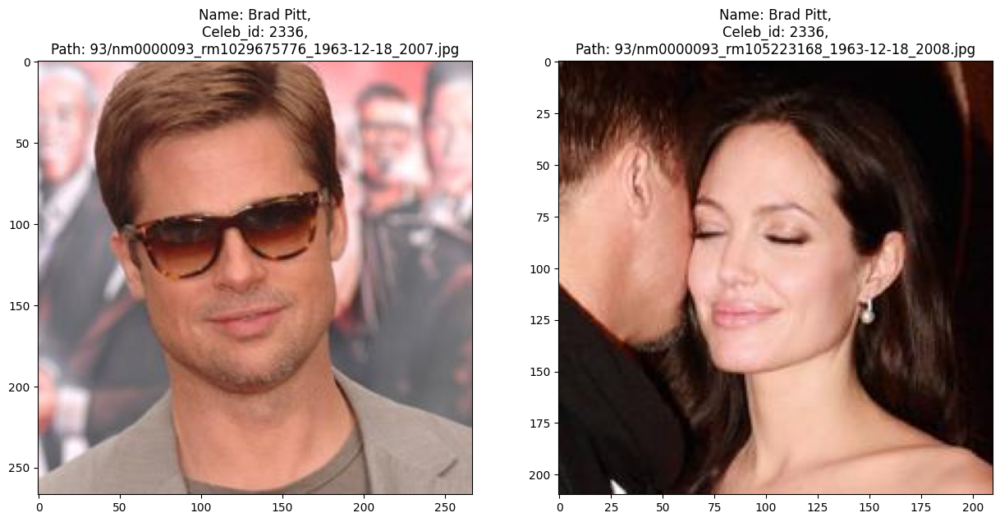

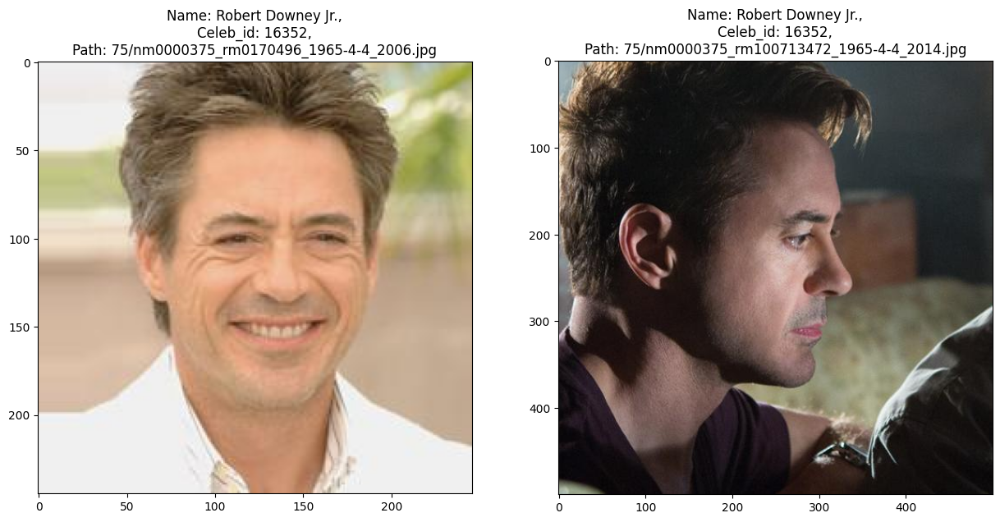

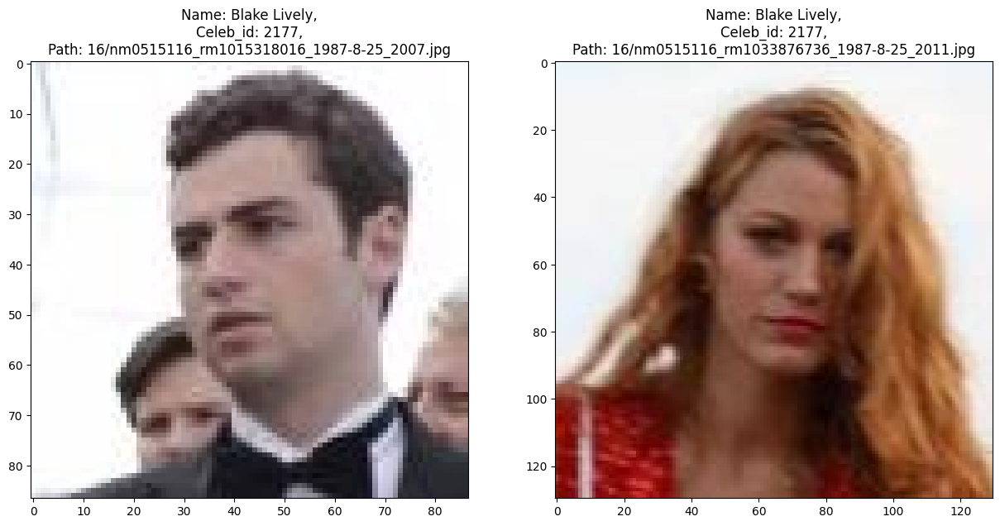

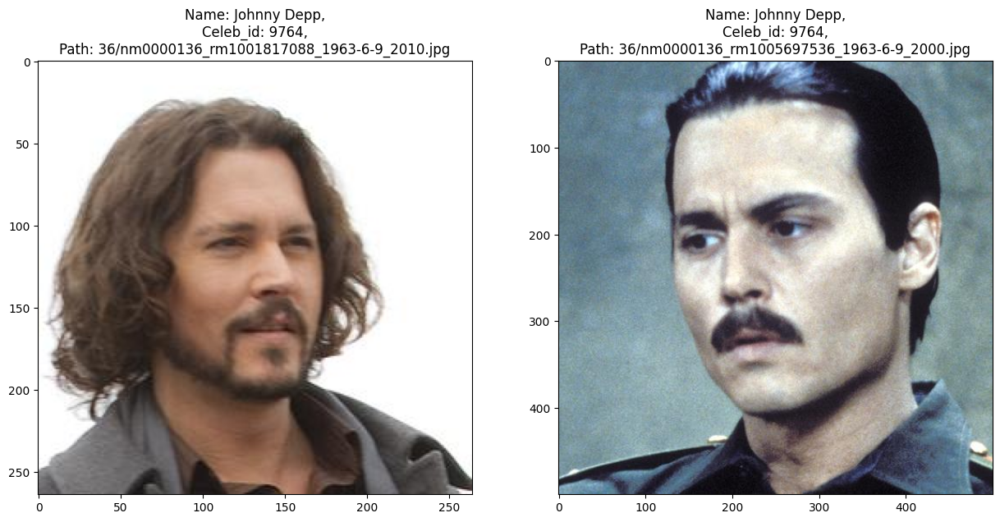

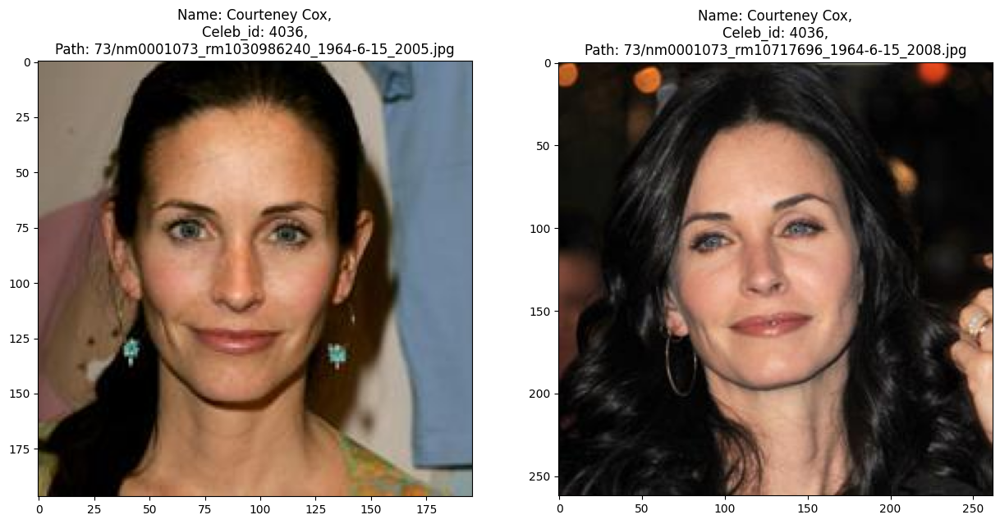

...

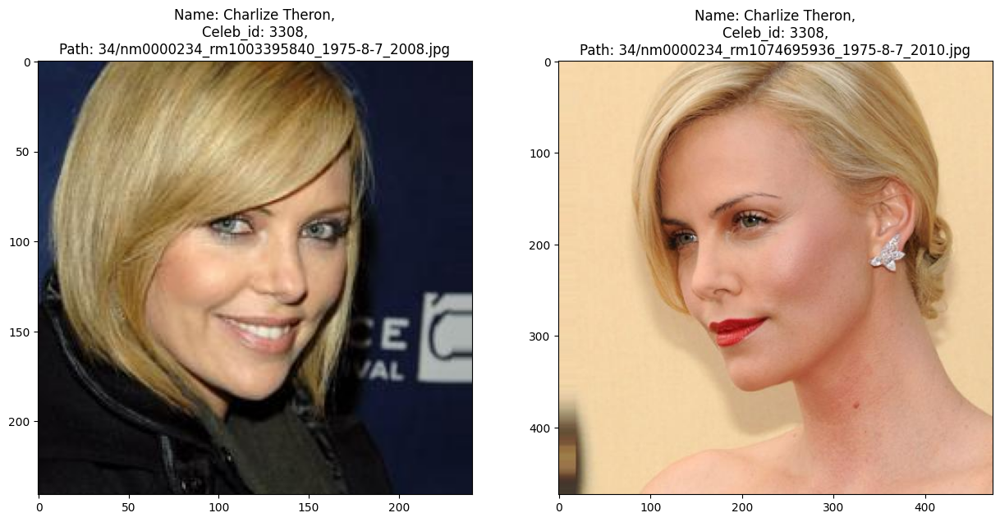

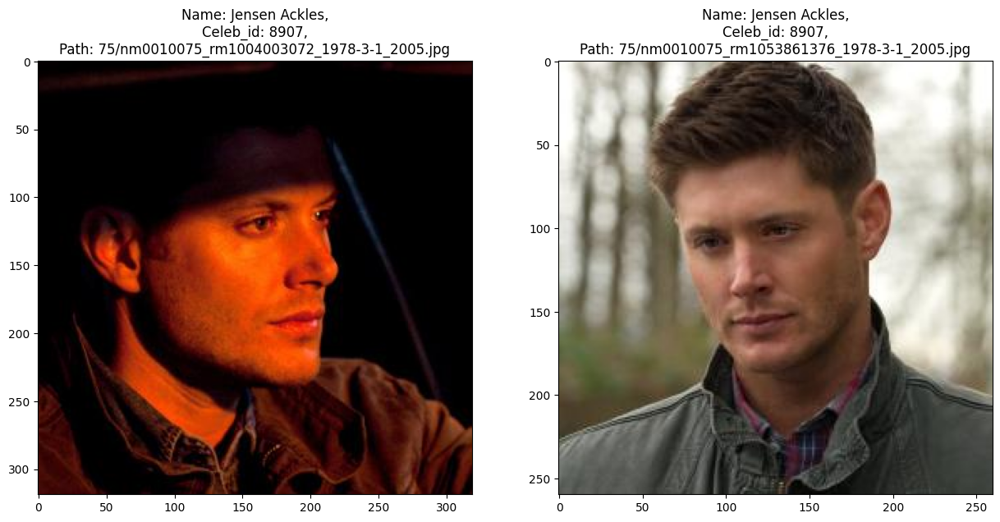

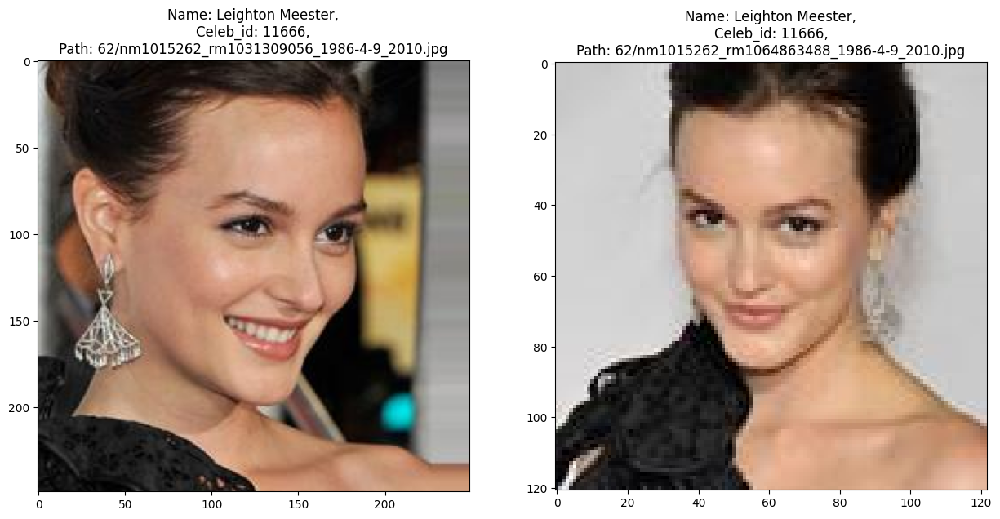

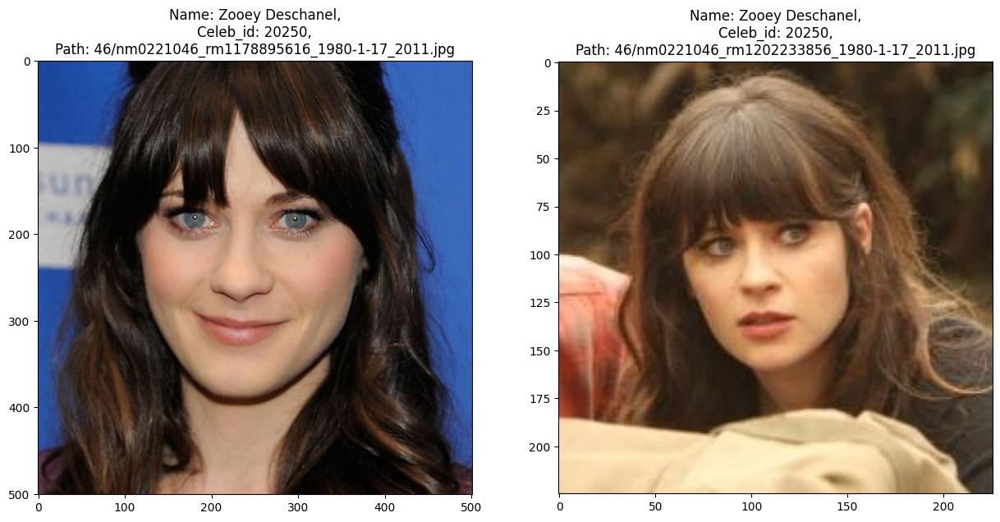

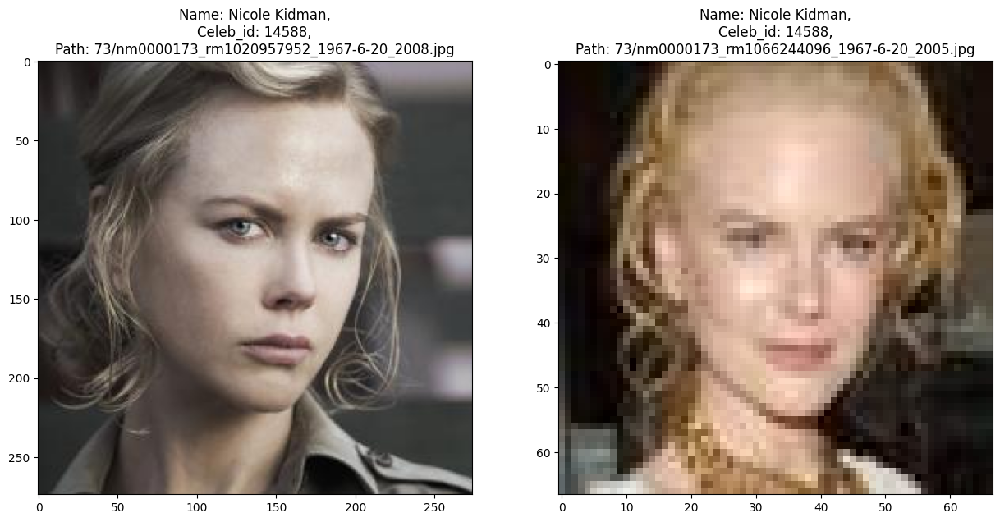

In [244]:
for id in set(celebs_images['celeb_id']):
  i = 0
  plt.figure(figsize=(15,8))
  while(i < 2):
    line = celebs_images[celebs_images['celeb_id'] == id].iloc[i]
    i += 1
    plt.subplot(1,2,i)
    name = str(line['name'][2:-2])
    path = str(line['full_path'][2:-2])
    plt.title(f'Name: {name},\nCeleb_id: {id},\nPath: {path}')
    path = '/content/imdb_crop/' + path
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
  plt.show()

There are falsley tagged images - such as the next one.
We will drop this specific one, but there are more falsley tagges images in the dataset.

,Unnamed: 0,photo_taken,full_path,gender,name,face_score,second_face_score,celeb_id
10334,10334,2005,['29/nm0000129_rm1045731840_1962-7-3_2005.jpg'],1.0,['Tom Cruise'],3.123614,NaN,19084


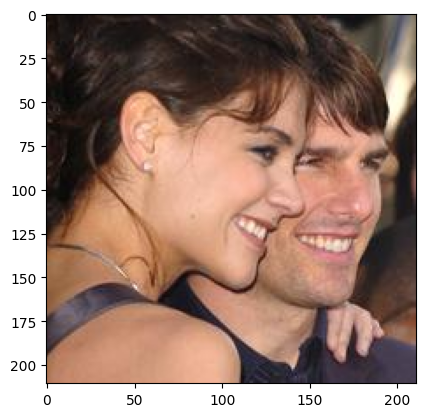

In [260]:
## Validate that the image's second_face_score is NaN - Falsly tagged as one face image
plt.imshow(cv2.cvtColor(cv2.imread('/content/imdb_crop/29/nm0000129_rm1045731840_1962-7-3_2005.jpg'),cv2.COLOR_BGR2RGB))

data[data['full_path'] == "['29/nm0000129_rm1045731840_1962-7-3_2005.jpg']"]

In [261]:
row = celebs_images[celebs_images['full_path'] == "['29/nm0000129_rm1045731840_1962-7-3_2005.jpg']"]

# Drop the image from dataset
celebs_images = celebs_images.drop(row.index)

# Create Our Own Dataset object

Now we will create a new Dataset object for this specific dataset,
It will get as parameters:
- `data`: all the features
- `targets`: the corresponding labels
- `transforms`: augmentations compose

the `__getitem__()` function will return:
- `image`: the augmented image (after applying one of the augmentations given while initializing the Dataset)
- `label`: the label

In [262]:
class CelebImagesDataset(Dataset):

  def __init__(self, data , targets , transforms = None):
    super(CelebImagesDataset, self).__init__()
    self.xs = data
    self.ys = targets
    self.transforms = transforms


  def __getitem__(self, idx):
    # get the original image
    path = '/content/imdb_crop/' + str(self.xs.loc[idx]['full_path'][2:-2])
    print(path)
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    label = self.ys[idx]

    # image augmentation
    if self.transforms:
      augmented = self.transforms(image=image)
      image = augmented['image']

    return image, label


  def __len__(self):
    return len(self.ys)

## Applying Augmentations

Image augmentations can significantly enhance the performance of a facial recognition model by artificially increasing the diversity and quantity of the training data. Techniques such as rotation, scaling, flipping, and adding noise help the model generalize better by exposing it to various variations and distortions that might occur in real-world scenarios. This leads to improved robustness, as the model learns to recognize faces under different angles, lighting conditions, and expressions, ultimately reducing overfitting and improving accuracy on unseen data. Augmentation essentially simulates a more extensive and varied dataset, which is crucial for developing a resilient and reliable facial recognition system.

We will perform the following augmentations:

- **Blur**: Helps the model recognize faces with varying degrees of focus, enhancing robustness to image quality.
- **Rotate**: Trains the model to identify faces from different angles, improving its ability to generalize across orientations.
- **Horizontal Flip**: Increases recognition accuracy by teaching the model to identify mirrored versions of faces.
- **Random Brightness Contrast**: Makes the model resilient to lighting variations, enabling it to recognize faces under different lighting conditions.
- **Gauss Noise**: Improves the model's robustness by training it to identify faces in noisy or low-quality images.

In [263]:
# define augmentation compose
transforms = A.Compose([
    OneOf([
        Blur(blur_limit=5),         ### Blurred images
        Rotate(limit=45),           ### Rotated images
        HorizontalFlip(),           ### Mirroring camera / mirror images
        RandomBrightnessContrast(), ### Edited / different settings
        GaussNoise()                ### Gaussian Noise on image
        ],
        p=0.8)
    ])

## Initialize Dataset

In [264]:
celeb_images_dataset = CelebImagesDataset(data = celebs_images.drop('celeb_id',axis=1), targets = celebs_images['celeb_id'],  transforms =  transforms)

let's get a random image from the dataset

/content/imdb_crop/01/nm0001401_rm106935040_1975-6-4_2011.jpg


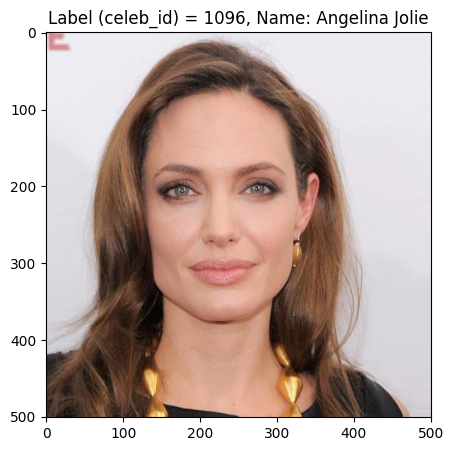

In [265]:
rnd = np.random.randint(len(celeb_images_dataset))
img, label = celeb_images_dataset[rnd]
name = celebs_df[celebs_df['celeb_id'] == label].iat[0,2]


plt.figure(figsize=(5,5))
plt.title(f'Label (celeb_id) = {label}, Name: {name}')
plt.imshow(img)
plt.show()


# Face Detection

Face detection using OpenCV's pre-trained models provides a quick and efficient way to identify faces in images without the need for extensive training on your custom dataset. By leveraging models like Haar Cascades or Deep Neural Networks (DNN) available in OpenCV, you can detect faces in various images with reasonable accuracy. This approach is particularly useful when you need a reliable, out-of-the-box solution for face detection tasks, allowing you to focus on other aspects of your project without investing time and resources into training a model from scratch.







/content/imdb_crop/01/nm0001401_rm106935040_1975-6-4_2011.jpg


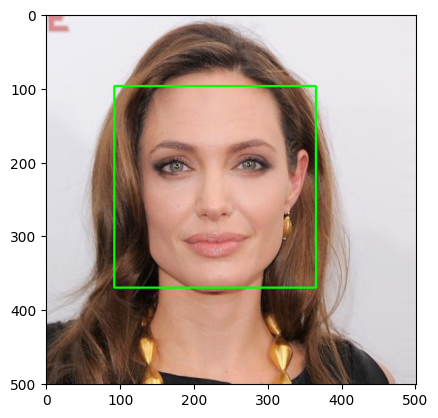

In [266]:
# Load the model
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Get a sample
img, __  = celeb_images_dataset[rnd]

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, 'gray')

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Draw rectangle around the faces
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Display
plt.imshow(img)

# Face Swap

Utilizing a face detection model for face swapping involves detecting and localizing faces in images, then seamlessly transferring facial features from one face to another. By leveraging OpenCV's pre-trained face detection models, you can accurately identify facial landmarks and regions. These detected faces are then aligned and blended onto a target face, preserving expressions and skin tones for a realistic swap. This technique is widely used in various applications, including entertainment and augmented reality, offering a creative and powerful way to modify or transform facial appearances in images and videos.

In [267]:
def detect_faces(image, face_cascade):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    return faces

def extract_face(image, face_coords):
    (x, y, w, h) = face_coords
    return image[y:y+h, x:x+w]

def resize_face(face, target_size):
    return cv2.resize(face, target_size)

def seamless_clone_swap(image1, image2, face_coords1, face_coords2):
    face1 = extract_face(image1, face_coords1)
    face2 = extract_face(image2, face_coords2)

    face1_resized = resize_face(face1, (face_coords2[2], face_coords2[3]))
    face2_resized = resize_face(face2, (face_coords1[2], face_coords1[3]))

    center1 = (face_coords1[0] + face_coords1[2]//2, face_coords1[1] + face_coords1[3]//2)
    center2 = (face_coords2[0] + face_coords2[2]//2, face_coords2[1] + face_coords2[3]//2)

    output1 = cv2.seamlessClone(face2_resized, image1, np.full(face2_resized.shape, 255, image1.dtype), center1, cv2.NORMAL_CLONE)
    output2 = cv2.seamlessClone(face1_resized, image2, np.full(face1_resized.shape, 255, image2.dtype), center2, cv2.NORMAL_CLONE)

    return output1, output2

def swap_faces_in_images(image1, image2):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    faces1 = detect_faces(image1, face_cascade)
    faces2 = detect_faces(image2, face_cascade)

    if len(faces1) == 0 or len(faces2) == 0:
        raise ValueError("Could not detect faces in one or both images.")


    result_img1, result_img2 = seamless_clone_swap(image1, image2, faces1[0], faces2[0])

    return result_img1, result_img2

/content/imdb_crop/01/nm0001401_rm3311767040_1975-6-4_2009.jpg
/content/imdb_crop/50/nm0004950_rm1085061120_1972-4-17_2003.jpg


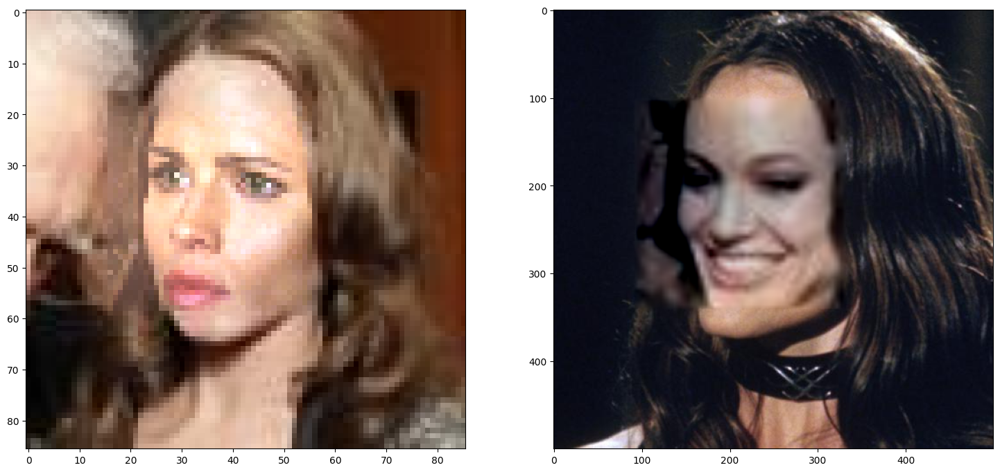

In [283]:
image1, __ = celeb_images_dataset[np.random.randint(0, len(celeb_images_dataset))]
image2, __ = celeb_images_dataset[np.random.randint(0, len(celeb_images_dataset))]

result_img1, result_img2 = swap_faces_in_images(image1, image2)

# Display the results
plt.figure(figsize=(18,10))
plt.subplot(1,2,1)
plt.imshow(result_img1)
plt.subplot(1,2,2)
plt.imshow(result_img2)
plt.show()
